# Reformatting Data

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split

nltk.download('stopwords')

# rewriting the dataset format so that it works with tutorial
# rewriting without stop words

# this code does not take long to run so rewriting the files doesnt take too much time

def parse_text(text): # removing stop words
    text = re.sub("[^a-zA-Z]", ' ', text)
    text = text.lower().split()
    swords = set(stopwords.words("english"))
    text = [w for w in text if w not in swords]
    text = " ".join(text)

    return text


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [2]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

In [3]:
def get_word_counts(text):
  return len(text.split())

Twitter Data Formatting

In [ ]:
twitter_data = pd.read_csv('./drive/MyDrive/CMSC742 Project/Datasets/twitterdata.csv')
twitter_data = twitter_data.dropna()

In [ ]:
gpt_word_counts = twitter_data['gpt'].map(get_word_counts)
real_word_counts = twitter_data['real'].map(get_word_counts)
twitter_data['gpt_word_counts'] = gpt_word_counts
twitter_data['real_word_counts'] = real_word_counts

In [ ]:
twitter_data = twitter_data[twitter_data['gpt_word_counts'] > 5]

In [ ]:
twitter_data

,Unnamed: 0,gpt,prompt,real,gpt_word_counts,real_word_counts
0,0,COVID-19 is still a serious threat to public h...,Prompt: Generate 10000 original tweets about C...,Also...and I know I keep posting this but it's...,20,38
1,1,Vaccines are an important tool in the fight ag...,Prompt: Generate 10000 original tweets about C...,Hackers are taking advantage of heightened con...,22,35
2,2,The COVID-19 pandemic has highlighted the impo...,Prompt: Generate 10000 original tweets about C...,You never know this COVID-19 thing is serious ...,13,22
3,3,The COVID-19 pandemic has caused significant e...,Prompt: Generate 10000 original tweets about C...,It's a 2 hr long lineup to the billing in the ...,22,51
4,4,COVID-19 has disproportionately affected margi...,Prompt: Generate 10000 original tweets about C...,Today I took advantage of these gas prices and...,17,49
...,...,...,...,...,...,...
359,362,Let's continue to support our local artists an...,prompt: please generate 100 tweets about COVID...,@Ryanair I'm trying to change flights.The flig...,21,46
360,363,This pandemic has shown us how important it is...,prompt: please generate 100 tweets about COVID...,"Beauty, some spare #toiletpaper. Found The #Ep...",24,25
361,364,I urge everyone to continue to be kind and emp...,prompt: please generate 100 tweets about COVID...,It's pretty sad when the high point of your da...,20,41
362,365,COVID-19 has highlighted the importance of pri...,prompt: please generate 100 tweets about COVID...,I cant help but think about how much online s...,16,43


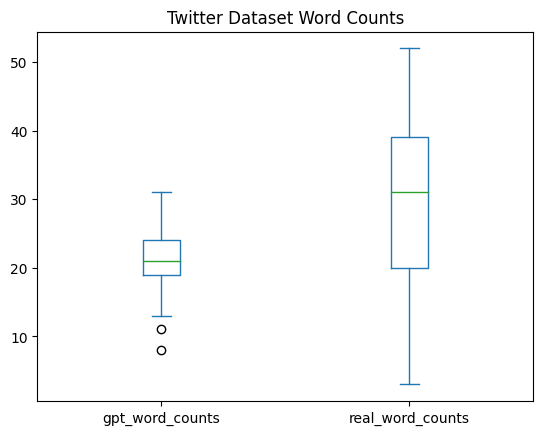

In [ ]:
ax = twitter_data[['gpt_word_counts','real_word_counts']].plot(kind='box', title='Twitter Dataset Word Counts')

In [ ]:
twitter = twitter_data

# 80/20 - train test split
train, test = train_test_split(twitter, test_size=0.2, random_state=0)

for index,row in train.iterrows():
  gpt_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/twitter/train/GPT/" + str(index) + ".txt"
  real_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/twitter/train/Real/" + str(index+366) + ".txt"

  if row['gpt'] is not np.nan:
    f = open(gpt_file, "w")
    f.write(row['gpt']) # comment out parse_text to keep stop words
    f.close()

  if row['real'] is not np.nan:
    f = open(real_file, "w")
    f.write(row['real'])
    f.close()

for index,row in test.iterrows():
  gpt_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/twitter/test/GPT/" + str(index) + ".txt"
  real_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/twitter/test/Real/" + str(index+366) + ".txt"

  if row['gpt'] is not np.nan:
    f = open(gpt_file, "w")
    f.write(row['gpt']) # comment out parse_text to keep stop words
    f.close()

  if row['real'] is not np.nan:
    f = open(real_file, "w")
    f.write(row['real'])
    f.close()

Reddit data formatting

In [6]:
reddit_data = pd.read_csv('./drive/MyDrive/CMSC742 Project/Datasets/redditdata.csv')
reddit_data = reddit_data.dropna()

In [7]:
gpt_word_counts = reddit_data['gpt'].map(get_word_counts)
real_word_counts = reddit_data['real'].map(get_word_counts)
reddit_data['gpt_word_counts'] = gpt_word_counts
reddit_data['real_word_counts'] = real_word_counts

In [13]:
reddit_data

,Unnamed: 0,gpt,prompt,real,gpt_word_counts,real_word_counts
0,0,\n\nShifting seasonal time is no longer worth ...,give me the text of a reddit post from r/math ...,I think it should be fixed on either UTC stand...,95,187
1,1,\n\nI'm not sure why people feel the need to s...,give me the text of a reddit post from r/funny...,Art is about the hardest thing to categorize i...,67,153
2,2,"\n\nAh, the Wall Street Journal. It's a source...",give me the text of a reddit post from r/Borde...,Ask me what I think about the Wall Street Jour...,65,150
3,3,\n\nIt's really sad that joysticks have become...,give me the text of a reddit post from r/gamin...,"In Mechwarrior Online, I have begun to use a m...",158,233
4,4,"\n\nHey everyone, \n\nI've been playing Diablo...",give me the text of a reddit post from r/Diabl...,"You are talking about the Charsi imbue, right?...",50,412
...,...,...,...,...,...,...
851,851,\n\nThis is an interesting question. It's true...,give me the text of a reddit post from r/AskSo...,"Let me try again:\n\n&gt;If you pay for one, w...",187,274
852,852,\n\nI recently had a customer call in who was ...,give me the text of a reddit post from r/tales...,"As an englishman, your TL:DR Resonates.",129,6
853,853,"\n\nHey everyone, \n\nI recently got into a di...",give me the text of a reddit post from r/mylit...,1) Gilda's Past\n\nGilda was born in the home ...,101,260
854,854,\n\nIt happens to me all the time. I'm out for...,give me the text of a reddit post from r/trees...,Something similar can happen to me if I take a...,136,98


In [19]:
short_gpt_posts = reddit_data[reddit_data['gpt_word_counts'] < 150]

,Unnamed: 0,gpt,prompt,real,gpt_word_counts,real_word_counts
0,0,\n\nShifting seasonal time is no longer worth ...,give me the text of a reddit post from r/math ...,I think it should be fixed on either UTC stand...,95,187
1,1,\n\nI'm not sure why people feel the need to s...,give me the text of a reddit post from r/funny...,Art is about the hardest thing to categorize i...,67,153
2,2,"\n\nAh, the Wall Street Journal. It's a source...",give me the text of a reddit post from r/Borde...,Ask me what I think about the Wall Street Jour...,65,150
4,4,"\n\nHey everyone, \n\nI've been playing Diablo...",give me the text of a reddit post from r/Diabl...,"You are talking about the Charsi imbue, right?...",50,412
5,5,\n\nHey Laqueristas!\n\nI recently purchased O...,give me the text of a reddit post from r/Reddi...,All but one of my nails were in the ballpark o...,81,134
...,...,...,...,...,...,...
850,850,"\n\nHey everyone,\n\nIf you're thinking about ...",give me the text of a reddit post from r/airso...,I'm working on a U.S. Ranger impression myself...,122,236
852,852,\n\nI recently had a customer call in who was ...,give me the text of a reddit post from r/tales...,"As an englishman, your TL:DR Resonates.",129,6
853,853,"\n\nHey everyone, \n\nI recently got into a di...",give me the text of a reddit post from r/mylit...,1) Gilda's Past\n\nGilda was born in the home ...,101,260
854,854,\n\nIt happens to me all the time. I'm out for...,give me the text of a reddit post from r/trees...,Something similar can happen to me if I take a...,136,98


In [ ]:
short_reddit_data = reddit_data[reddit_data['real_word_counts'] < 150]

In [ ]:
short_reddit_data.drop(['gpt','gpt_word_counts'], axis = 1)

short_reddit_data['gpt'] = list(short_gpt_posts['gpt'])[:len(short_reddit_data.index)]
short_reddit_data['gpt_word_counts'] = list(short_gpt_posts['gpt_word_counts'])[:len(short_reddit_data.index)]

<ipython-input-10-5d7514ed5721>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_reddit_data['gpt'] = list(short_gpt_posts['gpt'])[:len(short_reddit_data.index)]
<ipython-input-10-5d7514ed5721>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_reddit_data['gpt_word_counts'] = list(short_gpt_posts['gpt_word_counts'])[:len(short_reddit_data.index)]


In [ ]:
short_reddit_data

,Unnamed: 0,gpt,prompt,real,gpt_word_counts,real_word_counts
5,5,\n\nShifting seasonal time is no longer worth ...,give me the text of a reddit post from r/Reddi...,All but one of my nails were in the ballpark o...,95,134
7,7,\n\nI'm not sure why people feel the need to s...,give me the text of a reddit post from r/apple...,"So you're saying ""try it, I might not mind los...",67,142
8,8,"\n\nAh, the Wall Street Journal. It's a source...",give me the text of a reddit post from r/Reddi...,I love this idea and most definitely want to h...,65,137
10,10,"\n\nHey everyone, \n\nI've been playing Diablo...",give me the text of a reddit post from r/athei...,FALSE. Evidence: Wolfman is a man with hair al...,50,130
11,11,\n\nHey Laqueristas!\n\nI recently purchased O...,give me the text of a reddit post from r/quote...,"If the number of sides of any circle =&gt; 4, ...",81,14
...,...,...,...,...,...,...
842,842,"\n\nRecently, Riot Games has banned a professi...",give me the text of a reddit post from r/Fibro...,I've been taking tramadol for about a year and...,109,139
844,844,\n\nIf Riot really wants to enforce such harsh...,give me the text of a reddit post from r/world...,The Ontario medical association put an email o...,115,143
846,846,\n\nIt seems like Riot Games is trying to make...,give me the text of a reddit post from r/WTF w...,"I don't know the specifics, but in Ontario we ...",137,98
852,852,\n\nDocumenting your dreams routinely is a tou...,give me the text of a reddit post from r/tales...,"As an englishman, your TL:DR Resonates.",113,6


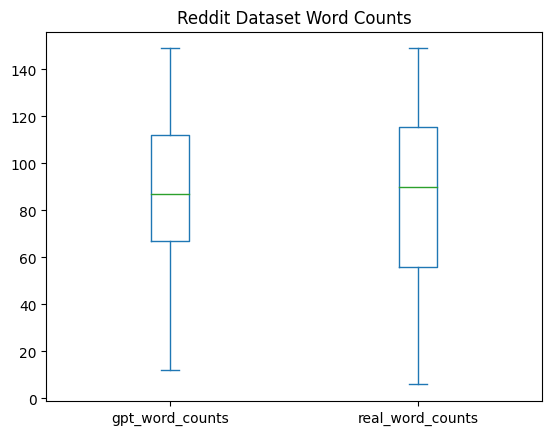

In [ ]:
ax = short_reddit_data[['gpt_word_counts','real_word_counts']].plot(kind='box', title='Reddit Dataset Word Counts')

In [9]:
medium_gpt_posts = reddit_data[(reddit_data['gpt_word_counts'] > 151) & (reddit_data['gpt_word_counts'] < 300)]
medium_gpt_posts 

,Unnamed: 0,gpt,prompt,real,gpt_word_counts,real_word_counts
3,3,\n\nIt's really sad that joysticks have become...,give me the text of a reddit post from r/gamin...,"In Mechwarrior Online, I have begun to use a m...",158,233
8,8,"\n\nHey everyone, \n\nWe wanted to take a mome...",give me the text of a reddit post from r/Reddi...,I love this idea and most definitely want to h...,159,137
15,15,\n\nI'm sure many of us can relate to this. Ju...,give me the text of a reddit post from r/leagu...,Didn't they lose 6 games in a row? Just becaus...,161,110
24,24,\n\nI recently had a series of seemingly unrel...,give me the text of a reddit post from r/AskRe...,"Long one, \n\nI was in Walmart, being chased b...",207,314
29,29,\n\nIt's funny how life works: we're all in a ...,give me the text of a reddit post from r/BMW w...,Ive actually had a guy speak to me at a stop l...,152,63
...,...,...,...,...,...,...
838,838,\n\nI've been a fan of Doctor Who for many yea...,give me the text of a reddit post from r/docto...,I liked her. I never really hate a companion u...,167,109
845,845,"\n\nHey everyone,\n\nI've been playing Runesca...",give me the text of a reddit post from r/runes...,How is the Runescape economy fucked? All the d...,186,177
846,846,\n\nIt's no secret that healthcare in the US i...,give me the text of a reddit post from r/WTF w...,"I don't know the specifics, but in Ontario we ...",167,98
849,849,\n\nAs someone who is in a non-monogamous rela...,give me the text of a reddit post from r/nonmo...,The following has worked well for me: I ask my...,217,1178


In [10]:
medium_reddit_data = reddit_data[(reddit_data['real_word_counts'] > 151) & (reddit_data['real_word_counts'] < 300)]
medium_reddit_data

,Unnamed: 0,gpt,prompt,real,gpt_word_counts,real_word_counts
0,0,\n\nShifting seasonal time is no longer worth ...,give me the text of a reddit post from r/math ...,I think it should be fixed on either UTC stand...,95,187
1,1,\n\nI'm not sure why people feel the need to s...,give me the text of a reddit post from r/funny...,Art is about the hardest thing to categorize i...,67,153
3,3,\n\nIt's really sad that joysticks have become...,give me the text of a reddit post from r/gamin...,"In Mechwarrior Online, I have begun to use a m...",158,233
6,6,"\n\nI'm sure I'm not alone in this, but I'm on...",give me the text of a reddit post from r/apple...,I could give a shit about turn by turn directi...,91,176
9,9,\n\nI recently visited the abandoned town of L...,give me the text of a reddit post from r/Aband...,Theres an entire small town under the lake by ...,87,207
...,...,...,...,...,...,...
841,841,"\n\nI'm sure I'm not alone in this, but when I...",give me the text of a reddit post from r/ADHD ...,I just quit Adderall XR myself. My doctor said...,80,156
845,845,"\n\nHey everyone,\n\nI've been playing Runesca...",give me the text of a reddit post from r/runes...,How is the Runescape economy fucked? All the d...,186,177
850,850,"\n\nHey everyone,\n\nIf you're thinking about ...",give me the text of a reddit post from r/airso...,I'm working on a U.S. Ranger impression myself...,122,236
851,851,\n\nThis is an interesting question. It's true...,give me the text of a reddit post from r/AskSo...,"Let me try again:\n\n&gt;If you pay for one, w...",187,274


In [16]:
#note: there are none
large_gpt_posts = reddit_data[(reddit_data['gpt_word_counts'] == 0)]
large_gpt_posts

,Unnamed: 0,gpt,prompt,real,gpt_word_counts,real_word_counts


In [ ]:
reddit = short_reddit_data

# 80/20 - train test split
train, test = train_test_split(reddit, test_size=0.2, random_state=0)

for index,row in train.iterrows():
  gpt_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/reddit/train/GPT/" + str(index) + ".txt"
  real_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/reddit/train/Real/" + str(index+366) + ".txt"

  if row['gpt'] is not np.nan:
    f = open(gpt_file, "w")
    f.write(row['gpt']) # comment out parse_text to keep stop words
    f.close()

  if row['real'] is not np.nan:
    f = open(real_file, "w")
    f.write(row['real'])
    f.close()

for index,row in test.iterrows():
  gpt_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/reddit/test/GPT/" + str(index) + ".txt"
  real_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/reddit/test/Real/" + str(index+366) + ".txt"

  if row['gpt'] is not np.nan:
    f = open(gpt_file, "w")
    f.write(row['gpt']) # comment out parse_text to keep stop words
    f.close()

  if row['real'] is not np.nan:
    f = open(real_file, "w")
    f.write(row['real'])
    f.close()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

abstracts = pd.read_csv("/content/drive/MyDrive/CMSC742 Project/Datasets/abstracts.csv")

# 80/20 - train test split
train, test = train_test_split(abstracts, test_size=0.2, random_state=0)

for index,row in train.iterrows():
  gpt_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/abstracts/train/GPT/" + str(index) + ".txt"
  real_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/abstracts/train/Real/" + str(index+366) + ".txt"

  if row['generated_abstract'] is not np.nan:
    f = open(gpt_file, "w")
    f.write(row['generated_abstract']) # comment out parse_text to keep stop words
    f.close()

  if row['abstract'] is not np.nan:
    f = open(real_file, "w")
    f.write(row['abstract'])
    f.close()

for index,row in test.iterrows():
  gpt_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/abstracts/test/GPT/" + str(index) + ".txt"
  real_file = "/content/drive/MyDrive/CMSC742 Project/Datasets/abstracts/test/Real/" + str(index+366) + ".txt"

  if row['generated_abstract'] is not np.nan:
    f = open(gpt_file, "w")
    f.write(row['generated_abstract']) # comment out parse_text to keep stop words
    f.close()

  if row['abstract'] is not np.nan:
    f = open(real_file, "w")
    f.write(row['abstract'])
    f.close()

# Twitter Classifier

info about using pandas for data input: https://www.tensorflow.org/tutorials/load_data/csv

Based on https://www.tensorflow.org/tutorials/keras/text_classification

In [ ]:
import matplotlib.pyplot as plt
import os
import re
import shutil
import string
import tensorflow as tf
import numpy as np
import pandas as pd
import random

from tensorflow.keras import layers
from tensorflow.keras import losses

In [ ]:
gpt_label = [0] * len(twitter_data['gpt'])
real_label = [1] * len(twitter_data['real'])

In [ ]:
examples = twitter_data['gpt'] + twitter_data['real']
labels = gpt_label + real_label

In [ ]:
raw_ds = list(zip(examples, labels))
raw_ds = list(filter(lambda x: x[0] != 'nan' and x[1] != 'nan', raw_ds))

# raw_ds = [(examples[i], labels[i]) for i in range(0, len(examples))]
# raw_ds = [x for x in raw_ds if str(x[0]) != 'nan' and str(x[1] != 'nan')]

In [ ]:
random.shuffle(raw_ds)
raw_train_ds = tf.data.experimental.from_list(raw_ds[0:len(raw_ds)-100])
raw_val_ds = tf.data.experimental.from_list(raw_ds[len(raw_ds)-100:len(raw_ds)-10])
raw_test_ds = tf.data.experimental.from_list(raw_ds[len(raw_ds)-10:])

^---------------------------------------------------- needed later ---------------------------^

In [ ]:
batch_size = 32
seed = 42

raw_train_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/twitter/train/', 
    batch_size=batch_size, 
    validation_split=0.2, 
    subset='training', 
    seed=seed)

Found 568 files belonging to 2 classes.
Using 455 files for training.


In [ ]:
for text_batch, label_batch in raw_train_ds.take(1):
  for i in range(3):
    print("Review", text_batch.numpy()[i])
    print("Label", label_batch.numpy()[i])

Review b'COVID-19 has disproportionately impacted women, particularly those in essential worker and caregiving roles.'
Label 0
Review b'COVID-19 vaccines are a critical tool in protecting our international development efforts and supporting sustainable development goals.'
Label 0
Review b"I don't know about you guys, but I'm pretty sure I've watched everything there is to watch on Netflix since the pandemic started."
Label 0


In [ ]:
print("Label 0 corresponds to", raw_train_ds.class_names[0])
print("Label 1 corresponds to", raw_train_ds.class_names[1])

Label 0 corresponds to GPT
Label 1 corresponds to Real


In [ ]:
raw_val_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/twitter/train/', 
    batch_size=batch_size, 
    validation_split=0.2, 
    subset='validation', 
    seed=seed)

Found 568 files belonging to 2 classes.
Using 113 files for validation.


In [ ]:
raw_test_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/twitter/test/', 
    batch_size=batch_size)

Found 144 files belonging to 2 classes.


In [ ]:
# numbers from tutorial
max_features = 10000
sequence_length = 250

vectorize_layer = layers.TextVectorization(
    max_tokens = max_features,
    output_mode = 'int',
    output_sequence_length = sequence_length
)

In [ ]:
train_text = raw_train_ds.map(lambda x, y: x)
vectorize_layer.adapt(train_text)

In [ ]:
def vectorize_text(text, label):
  text = tf.expand_dims(text, -1)
  return vectorize_layer(text), label

In [ ]:
raw_train_ds.class_names

['GPT', 'Real']

In [ ]:
print("1287 ---> ",vectorize_layer.get_vocabulary()[1287])
print(" 313 ---> ",vectorize_layer.get_vocabulary()[313])
print('Vocabulary size: {}'.format(len(vectorize_layer.get_vocabulary())))

1287 --->  sold
 313 --->  roll
Vocabulary size: 2756


In [ ]:
train_ds = raw_train_ds.map(vectorize_text)
val_ds = raw_val_ds.map(vectorize_text)
test_ds = raw_test_ds.map(vectorize_text)

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
embedding_dim = 16

In [ ]:
model = tf.keras.Sequential([
  layers.Embedding(max_features + 1, embedding_dim),
  layers.Dropout(0.2),
  layers.GlobalAveragePooling1D(),
  layers.Dropout(0.2),
  layers.Dense(1)])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 16)          160016    
                                                                 
 dropout (Dropout)           (None, None, 16)          0         
                                                                 
 global_average_pooling1d (G  (None, 16)               0         
 lobalAveragePooling1D)                                          
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense (Dense)               (None, 1)                 17        
                                                                 
Total params: 160,033
Trainable params: 160,033
Non-trainable params: 0
__________________________________________________

In [ ]:
model.compile(loss=losses.BinaryCrossentropy(from_logits=True),
              optimizer='adam',
              metrics=tf.metrics.BinaryAccuracy(threshold=0.0))

In [ ]:
epochs = 30
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs)

Epoch 1/30
15/15 [==============================] - 2s 56ms/step - loss: 0.6932 - binary_accuracy: 0.5209 - val_loss: 0.6923 - val_binary_accuracy: 0.5044
Epoch 2/30
15/15 [==============================] - 0s 8ms/step - loss: 0.6929 - binary_accuracy: 0.5253 - val_loss: 0.6916 - val_binary_accuracy: 0.5044
Epoch 3/30
15/15 [==============================] - 0s 11ms/step - loss: 0.6910 - binary_accuracy: 0.5978 - val_loss: 0.6909 - val_binary_accuracy: 0.8407
Epoch 4/30
15/15 [==============================] - 0s 8ms/step - loss: 0.6901 - binary_accuracy: 0.6791 - val_loss: 0.6901 - val_binary_accuracy: 0.9735
Epoch 5/30
15/15 [==============================] - 0s 9ms/step - loss: 0.6887 - binary_accuracy: 0.7209 - val_loss: 0.6893 - val_binary_accuracy: 0.8496
Epoch 6/30
15/15 [==============================] - 0s 9ms/step - loss: 0.6882 - binary_accuracy: 0.7033 - val_loss: 0.6885 - val_binary_accuracy: 0.6903
Epoch 7/30
15/15 [==============================] - 0s 10ms/step - loss: 0

In [ ]:
loss, accuracy = model.evaluate(test_ds)

print("Loss: ", loss)
print("Accuracy: ", accuracy)

5/5 [==============================] - 0s 3ms/step - loss: 0.6417 - binary_accuracy: 0.9583
Loss:  0.6417263150215149
Accuracy:  0.9583333134651184


In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

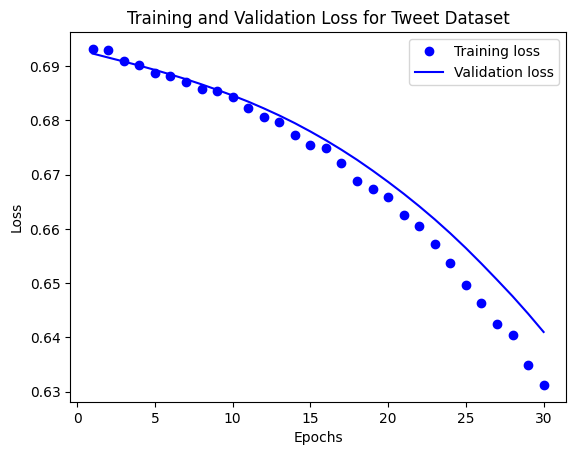

In [ ]:
acc = history_dict['binary_accuracy']
val_acc = history_dict['val_binary_accuracy']
loss = history_dict['loss']
val_loss = history_dict['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation Loss for Tweet Dataset')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

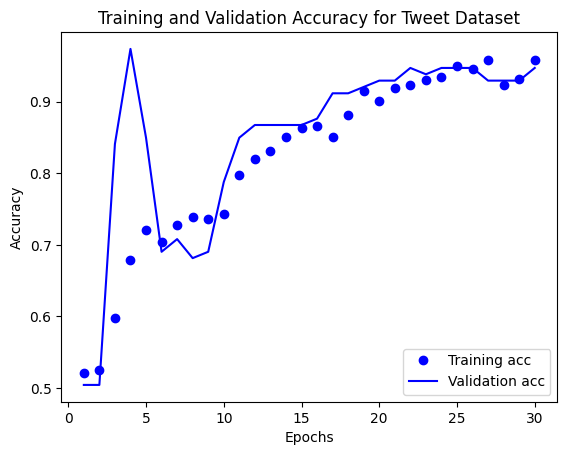

In [ ]:
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and Validation Accuracy for Tweet Dataset')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.show()

In [ ]:
export_model = tf.keras.Sequential([
  vectorize_layer,
  model,
  layers.Activation('sigmoid')
])

export_model.compile(
    loss=losses.BinaryCrossentropy(from_logits=False), optimizer="adam", metrics=['accuracy']
)

# Test it with `raw_test_ds`, which yields raw strings
loss, accuracy = export_model.evaluate(raw_test_ds)
print(accuracy)

5/5 [==============================] - 0s 4ms/step - loss: 0.6417 - accuracy: 0.9583
0.9583333134651184


In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=3e5dfb6eaaf70ca0889c92d0052208714b6518244489ca54872889683a84993b
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [ ]:
from lime.lime_text import LimeTextExplainer

GPT: COVID-19 is still a serious threat to public health. It's important to continue taking precautions to protect ourselves and others.

Real: Also...and I know I keep posting this but it's important. Get your #PPE and #quarantine supplies online, NOT in stores. This is one way you can make a HUGE difference towards the #FlattenTheCurve goals. https://t.co/VMP9ZH1fOo #coronavirus #PPEshortage #StayHome

In [ ]:
export_model.predict(["The COVID-19 pandemic has brought about significant changes in how we approach public health communication and messaging, with potential long-term impacts on public trust and engagement."])[0][0]

1/1 [==============================] - 0s 191ms/step


0.42603266

In [ ]:
def predict_proba(arr):
  output = []
  for text in arr:
    text = text.strip()
    if len(text) != 0:
      prob = export_model.predict([text], verbose = 0)[0][0]
      output.append(np.array([1-prob, prob]))
    else:
      output.append(np.array([0.5,0.5]))
    
  return np.array(output)

In [ ]:
explainer = LimeTextExplainer(class_names = ["GPT", "Real"])
text = "The COVID-19 pandemic has brought about significant changes in how we approach public health communication and messaging, with potential long-term impacts on public trust and engagement. "
LIME_exp = explainer.explain_instance(text, predict_proba, num_samples = 500, num_features = 10)

In [ ]:
LIME_exp.show_in_notebook(text = True)

In [ ]:
explainer = LimeTextExplainer(class_names = ["GPT", "Real"])
text = "Tweet circulated last night about an elderly couple sitting outside a grocery store, too fearful of CV to go in. It is different &amp; far more risky over about 65. Ask someone like that if they need a grocery run, or help with a grocery pickup account \r\r\n#CoronaVirus #news"
LIME_exp = explainer.explain_instance(text, predict_proba, num_samples = 500, num_features = 10)

In [ ]:
LIME_exp.show_in_notebook(text = True)

In [ ]:
twitter_data['gpt-score'] = np.nan
twitter_data['real-score'] = np.nan

for index,row in twitter_data.iterrows():
  twitter_data.at[index, 'gpt-score'] = export_model.predict([row['gpt']], verbose = 0)[0][0]
  twitter_data.at[index, 'real-score'] = export_model.predict([row['real']], verbose = 0)[0][0]

In [ ]:
pd.set_option('display.max_colwidth', None)

In [ ]:
print ("Average GPT Score: " + str(np.mean(twitter_data['gpt-score'])))
print ("Median GPT Score: " + str(np.median(twitter_data['gpt-score'])))
print ("Number Classified Incorrectly: " + str(len(twitter_data[twitter_data['gpt-score'] > 0.5])))

print ("Most confident classifications:")
twitter_data.sort_values('gpt-score', ascending=True).head(5)[['gpt','gpt-score']]

Average GPT Score: 0.46266094285450626
Median GPT Score: 0.462089478969574
Number Classified Incorrectly: 7
Most confident classifications:


,gpt,gpt-score
57,"The COVID-19 pandemic has brought about significant changes in how we approach public health communication and messaging, with potential long-term impacts on public trust and engagement.",0.426033
81,"The COVID-19 pandemic has brought about significant changes in how we approach public health emergency preparedness and response, with potential long-term impacts on national security and defense.",0.428095
167,"The COVID-19 pandemic has brought about significant changes in how we approach public transportation and mobility, with potential long-term impacts on urban planning and infrastructure development.",0.429960
119,"The COVID-19 pandemic has brought about significant changes in how we approach public communication and media, with potential long-term impacts on the role and responsibility of journalism and information dissemination.",0.430982
92,"The COVID-19 pandemic has brought about significant changes in how we approach public communication and media, with potential long-term impacts on the role and responsibility of journalism and information dissemination.",0.430982


In [ ]:
print ("Average GPT Score: " + str(np.mean(twitter_data['real-score'])))
print ("Median GPT Score: " + str(np.median(twitter_data['real-score'])))
print ("Number Classified Incorrectly: " + str(len(twitter_data[twitter_data['real-score'] < 0.5])))

print ("Most confident classifications:")
twitter_data.sort_values('real-score', ascending=False).head(5)[['real','real-score']]

Average GPT Score: 0.524456256561065
Median GPT Score: 0.5217413306236267
Number Classified Incorrectly: 16
Most confident classifications:


,real,real-score
160,"Tweet circulated last night about an elderly couple sitting outside a grocery store, too fearful of CV to go in. It is different &amp; far more risky over about 65. Ask someone like that if they need a grocery run, or help with a grocery pickup account \r\n\r\n#CoronaVirus #news",0.576030
281,.@Tesco we are a couple with a baby self isolating due to covid-19 infection for at least another week yet there are no delivery slots or even click&amp;collect until APRIL 1st. We live 45 min from a supermarket so asking neighbours is a big ask. What are we supposed to do? #covid19,0.571664
150,"Be like my girlfriend Leah. She was picking up cans of soup at the grocery store then thought. ""I already have a lot at home. Better leave it for someone who doesn't "". Small things can help a lot. Stay safe. #Covid_19 #SocialDistancing #CoronaVirusUpdate #loveeachother",0.561518
291,"NYS is aware that there is an uptick of #Coronavirus scams on social media, emails, texts and websites. \r\n\r\n\r\n\r\nIf you're aware of a scam involving a financial product or service, visit the @NYDFS website or call their Consumer Hotline at: 1(800) 342-3736.\r\n\r\n\r\n\r\nhttps://t.co/MqPbpLOZyY",0.560898
326,"HereÂs an idea... If you have a car or live local to a supermarket, leave the #CoOp for the elderly and vulnerable!! WouldnÂt it be great if they had somewhere local that us young uns dedicate to them! IÂd happily donate to cover the more expensive prices. #coronavirus #COVID19",0.560852


# Reddit Classifier

Based on https://www.tensorflow.org/tutorials/keras/text_classification

In [ ]:
gpt_label = [0] * len(reddit_data['gpt'])
real_label = [1] * len(reddit_data['real'])

In [ ]:
batch_size = 32
seed = 42

raw_train_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/reddit/train/', 
    batch_size=batch_size, 
    validation_split=0.2, 
    subset='training', 
    seed=seed)

Found 612 files belonging to 2 classes.
Using 490 files for training.


In [ ]:
for text_batch, label_batch in raw_train_ds.take(1):
  for i in range(3):
    print("Review", text_batch.numpy()[i])
    print("Label", label_batch.numpy()[i])

Review b"Here's proof that you are affected. You're a fucking moron in denial that's why you can't help replying with anger and butthurt indignation. If you truly weren't affected, you would have ignored this entire.\n\n**TL;DR:** you're a fucking idiot. lol"
Label 1
Review b"In addition, when you throw needles away into the trash bin in California, AB 939 (I think that's the code) sends some of the trash to a recycling sorting facility in order to reclaim some of the materials.  In those sorting facilities, there are belts that move the trash past a line of workers that hand sort as much recycling from trash as possible.  Though they wear gloves, when needles are mixed in with the trash they can come flying out of the device that dispenses them quickly, impaling the workers hands.  Beyond causing obvious pain, this can spread blood borne pathogens the inflicted.\n\nTL;DR: Throw a needle in the trash - it might end up in a waste facility employee's hand."
Label 1
Review b'\n\nUpsamplin

In [ ]:
print("Label 0 corresponds to", raw_train_ds.class_names[0])
print("Label 1 corresponds to", raw_train_ds.class_names[1])

Label 0 corresponds to GPT
Label 1 corresponds to Real


In [ ]:
raw_val_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/reddit/train/', 
    batch_size=batch_size, 
    validation_split=0.2, 
    subset='validation', 
    seed=seed)

Found 612 files belonging to 2 classes.
Using 122 files for validation.


In [ ]:
raw_test_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/reddit/test/', 
    batch_size=batch_size)

Found 154 files belonging to 2 classes.


In [ ]:
# numbers from tutorial
max_features = 10000
sequence_length = 250

vectorize_layer = layers.TextVectorization(
    max_tokens = max_features,
    output_mode = 'int',
    output_sequence_length = sequence_length
)

In [ ]:
train_text = raw_train_ds.map(lambda x, y: x)
vectorize_layer.adapt(train_text)

In [ ]:
def vectorize_text(text, label):
  text = tf.expand_dims(text, -1)
  return vectorize_layer(text), label

In [ ]:
raw_train_ds.class_names

['GPT', 'Real']

In [ ]:
print("1287 ---> ",vectorize_layer.get_vocabulary()[1287])
print(" 313 ---> ",vectorize_layer.get_vocabulary()[313])
print('Vocabulary size: {}'.format(len(vectorize_layer.get_vocabulary())))

1287 --->  crystal
 313 --->  fat
Vocabulary size: 5929


In [ ]:
train_ds = raw_train_ds.map(vectorize_text)
val_ds = raw_val_ds.map(vectorize_text)
test_ds = raw_test_ds.map(vectorize_text)

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
embedding_dim = 16

In [ ]:
reddit_model = tf.keras.Sequential([
  layers.Embedding(max_features + 1, embedding_dim),
  layers.Dropout(0.2),
  layers.GlobalAveragePooling1D(),
  layers.Dropout(0.2),
  layers.Dense(1)])

reddit_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 16)          160016    
                                                                 
 dropout (Dropout)           (None, None, 16)          0         
                                                                 
 global_average_pooling1d (G  (None, 16)               0         
 lobalAveragePooling1D)                                          
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense (Dense)               (None, 1)                 17        
                                                                 
Total params: 160,033
Trainable params: 160,033
Non-trainable params: 0
__________________________________________________

In [ ]:
reddit_model.compile(loss=losses.BinaryCrossentropy(from_logits=True),
              optimizer='adam',
              metrics=tf.metrics.BinaryAccuracy(threshold=0.0))

In [ ]:
epochs = 30
history = reddit_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs)

Epoch 1/30
16/16 [==============================] - 2s 54ms/step - loss: 0.6930 - binary_accuracy: 0.4918 - val_loss: 0.6926 - val_binary_accuracy: 0.5820
Epoch 2/30
16/16 [==============================] - 0s 11ms/step - loss: 0.6912 - binary_accuracy: 0.5898 - val_loss: 0.6917 - val_binary_accuracy: 0.5984
Epoch 3/30
16/16 [==============================] - 0s 12ms/step - loss: 0.6894 - binary_accuracy: 0.6531 - val_loss: 0.6907 - val_binary_accuracy: 0.6066
Epoch 4/30
16/16 [==============================] - 0s 11ms/step - loss: 0.6881 - binary_accuracy: 0.6857 - val_loss: 0.6898 - val_binary_accuracy: 0.6393
Epoch 5/30
16/16 [==============================] - 0s 9ms/step - loss: 0.6859 - binary_accuracy: 0.7449 - val_loss: 0.6887 - val_binary_accuracy: 0.6475
Epoch 6/30
16/16 [==============================] - 0s 10ms/step - loss: 0.6841 - binary_accuracy: 0.7612 - val_loss: 0.6876 - val_binary_accuracy: 0.6475
Epoch 7/30
16/16 [==============================] - 0s 9ms/step - loss:

In [ ]:
loss, accuracy = reddit_model.evaluate(test_ds)

print("Loss: ", loss)
print("Accuracy: ", accuracy)

5/5 [==============================] - 0s 3ms/step - loss: 0.6395 - binary_accuracy: 0.7792
Loss:  0.6394575238227844
Accuracy:  0.7792207598686218


In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

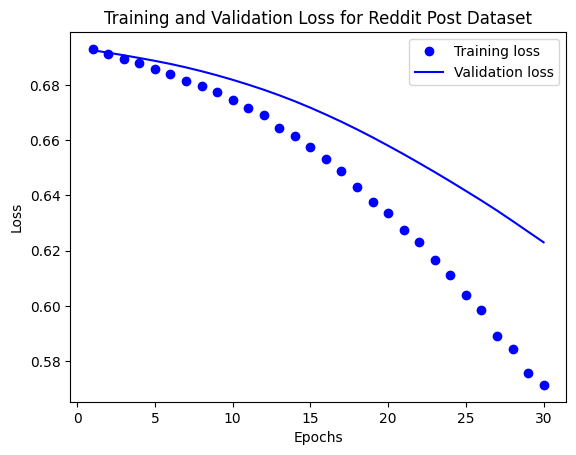

In [ ]:
acc = history_dict['binary_accuracy']
val_acc = history_dict['val_binary_accuracy']
loss = history_dict['loss']
val_loss = history_dict['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation Loss for Reddit Post Dataset')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

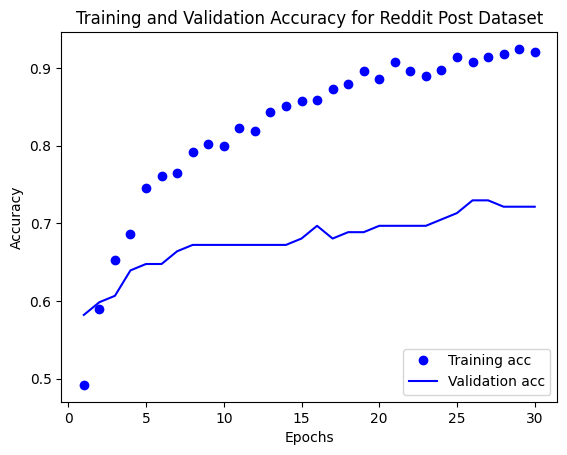

In [ ]:
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and Validation Accuracy for Reddit Post Dataset')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.show()

In [ ]:
reddit_export_model = tf.keras.Sequential([
  vectorize_layer,
  reddit_model,
  layers.Activation('sigmoid')
])

reddit_export_model.compile(
    loss=losses.BinaryCrossentropy(from_logits=False), optimizer="adam", metrics=['accuracy']
)

# Test it with `raw_test_ds`, which yields raw strings
loss, accuracy = reddit_export_model.evaluate(raw_test_ds)
print(accuracy)

5/5 [==============================] - 1s 6ms/step - loss: 0.6395 - accuracy: 0.7792
0.7792207598686218


In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 14.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=9eea18a72d6d60fa76e4b1156bfbe34fea1ca54221bcd1667ff19f4829c50f3a
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [ ]:
from lime.lime_text import LimeTextExplainer

In [ ]:
reddit_data['gpt-score'] = np.nan
reddit_data['real-score'] = np.nan

for index,row in reddit_data.iterrows():
  reddit_data.at[index, 'gpt-score'] = reddit_export_model.predict([row['gpt']], verbose = 0)[0][0]
  reddit_data.at[index, 'real-score'] = reddit_export_model.predict([row['real']], verbose = 0)[0][0]

In [ ]:
print ("Average GPT Score: " + str(np.mean(reddit_data['gpt-score'])))
print ("Median GPT Score: " + str(np.median(reddit_data['gpt-score'])))
print ("Number Classified Incorrectly: " + str(len(reddit_data[reddit_data['gpt-score'] > 0.5])))

print ("Most confident classifications:")
reddit_data.sort_values('gpt-score', ascending=True).head(5)[['gpt','gpt-score']]

Average GPT Score: 0.44056795490415473
Median GPT Score: 0.44746753573417664
Number Classified Incorrectly: 171
Most confident classifications:


,gpt,gpt-score
39,\n\nWe all know that drugs are a bad way to tr...,0.234597
793,\n\nIt's been a long time since I've been in t...,0.236532
190,\n\nHey everyone!\n\nI've been playing Pathfin...,0.248682
620,"\n\nHey everyone,\n\nI'm sure many of you have...",0.249538
245,\n\nHey everyone!\n\nI recently started runnin...,0.258227


In [ ]:
print ("Average GPT Score: " + str(np.mean(reddit_data['real-score'])))
print ("Median GPT Score: " + str(np.median(reddit_data['real-score'])))
print ("Number Classified Incorrectly: " + str(len(reddit_data[reddit_data['real-score'] < 0.5])))

print ("Most confident classifications:")
reddit_data.sort_values('real-score', ascending=False).head(5)[['real','real-score']]

Average GPT Score: 0.4739526514769995
Median GPT Score: 0.46772924065589905
Number Classified Incorrectly: 490
Most confident classifications:


,real,real-score
619,You see darius heading your way like a bull an...,0.673151
536,"When i began maining ADCs i played vayne, beca...",0.650419
284,&gt;I tooke a bodkine gh &amp; put it betwixt ...,0.632432
671,"They're both right. Female redditors are, on a...",0.632112
466,So even the title is misleading. This isn't a ...,0.628177


In [ ]:
def predict_proba(arr):
  output = []
  for text in arr:
    text = text.strip()
    if len(text) != 0:
      prob = reddit_export_model.predict([text], verbose = 0)[0][0]
      output.append(np.array([1-prob, prob]))
    else:
      output.append(np.array([0.5,0.5]))
    
  return np.array(output)

In [ ]:
explainer = LimeTextExplainer(class_names = ["GPT", "Real"])
text = "\n\nHave you ever wanted to experience something that you can't explain? Something that is beyond your own consciousness? DMT is a drug unlike any other that can bring you to a place that you have never been before.\n\nI believe that everyone who is considering trying DMT should do so correctly and safely. When taken correctly, it usually lasts from 5-15 minutes, and I typically sprinkle it on a bowl of weed and hold a lighter far enough away to vaporize/slightly combust the bud.\n\nCompared to other psychedelics, DMT is a far different experience. If salvia is a freakish nightmare, DMT is a beautiful and lucid dream. It can bring you to a place of understanding, creativity, and peace.\n\nIf you are considering trying DMT, please do so ..."
LIME_exp = explainer.explain_instance(text, predict_proba, num_samples = 2000, num_features = 10)

In [ ]:
LIME_exp.show_in_notebook(text = True)

In [ ]:
explainer = LimeTextExplainer(class_names = ["GPT", "Real"])
text = "sure! took a photograph of my face, and then another in the same position with my hands covering the face. selected the hands and isolated them from the rest. altered the contrast, saturation, and what have you. imported said hands into the image with the face, and used the photoshop effect \"overlay\" to combine the two images. then tooled around with the levels and everything til it looked how i wanted.\n\n**tl;dr:** photoshop magic."
LIME_exp = explainer.explain_instance(text, predict_proba, num_samples = 2000, num_features = 10)

In [ ]:
LIME_exp.show_in_notebook(text = True)

# Essay Classifier

Based on https://www.tensorflow.org/tutorials/keras/text_classification

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import matplotlib.pyplot as plt
import os
import re
import shutil
import string
import tensorflow as tf
import numpy as np
import pandas as pd
import random

from tensorflow.keras import layers
from tensorflow.keras import losses

In [ ]:
batch_size = 32
seed = 42

raw_train_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/essays/train/', 
    batch_size=batch_size, 
    validation_split=0.2, 
    subset='training', 
    seed=seed)

Found 202 files belonging to 2 classes.
Using 162 files for training.


In [ ]:
print("Label 0 corresponds to", raw_train_ds.class_names[0])
print("Label 1 corresponds to", raw_train_ds.class_names[1])

Label 0 corresponds to GPT
Label 1 corresponds to Real


In [ ]:
raw_val_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/essays/train/', 
    batch_size=batch_size, 
    validation_split=0.2, 
    subset='validation', 
    seed=seed)

Found 202 files belonging to 2 classes.
Using 40 files for validation.


In [ ]:
raw_test_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/essays/test/', 
    batch_size=batch_size)

Found 50 files belonging to 2 classes.


In [ ]:
# numbers from tutorial
max_features = 10000
sequence_length = 250

vectorize_layer = layers.TextVectorization(
    max_tokens = max_features,
    output_mode = 'int',
    output_sequence_length = sequence_length
)

In [ ]:
train_text = raw_train_ds.map(lambda x, y: x)
vectorize_layer.adapt(train_text)

In [ ]:
def vectorize_text(text, label):
  text = tf.expand_dims(text, -1)
  return vectorize_layer(text), label

In [ ]:
raw_train_ds.class_names

['GPT', 'Real']

In [ ]:
print("1287 ---> ",vectorize_layer.get_vocabulary()[1287])
print(" 313 ---> ",vectorize_layer.get_vocabulary()[313])
print('Vocabulary size: {}'.format(len(vectorize_layer.get_vocabulary())))

1287 --->  influenced
 313 --->  today
Vocabulary size: 4859


In [ ]:
train_ds = raw_train_ds.map(vectorize_text)
val_ds = raw_val_ds.map(vectorize_text)
test_ds = raw_test_ds.map(vectorize_text)

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
embedding_dim = 16

In [ ]:
essay_model = tf.keras.Sequential([
  layers.Embedding(max_features + 1, embedding_dim),
  layers.Dropout(0.2),
  layers.GlobalAveragePooling1D(),
  layers.Dropout(0.2),
  layers.Dense(1)])

essay_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, None, 16)          160016    
                                                                 
 dropout_4 (Dropout)         (None, None, 16)          0         
                                                                 
 global_average_pooling1d_2   (None, 16)               0         
 (GlobalAveragePooling1D)                                        
                                                                 
 dropout_5 (Dropout)         (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 160,033
Trainable params: 160,033
Non-trainable params: 0
________________________________________________

In [ ]:
essay_model.compile(loss=losses.BinaryCrossentropy(from_logits=True),
              optimizer='adam',
              metrics=tf.metrics.BinaryAccuracy(threshold=0.0))

In [ ]:
epochs = 30
history = essay_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs)

Epoch 1/30
6/6 [==============================] - 2s 146ms/step - loss: 0.6925 - binary_accuracy: 0.6111 - val_loss: 0.6920 - val_binary_accuracy: 0.5250
Epoch 2/30
6/6 [==============================] - 0s 10ms/step - loss: 0.6905 - binary_accuracy: 0.6728 - val_loss: 0.6911 - val_binary_accuracy: 0.4750
Epoch 3/30
6/6 [==============================] - 0s 10ms/step - loss: 0.6887 - binary_accuracy: 0.7222 - val_loss: 0.6901 - val_binary_accuracy: 0.5000
Epoch 4/30
6/6 [==============================] - 0s 10ms/step - loss: 0.6866 - binary_accuracy: 0.7654 - val_loss: 0.6891 - val_binary_accuracy: 0.5000
Epoch 5/30
6/6 [==============================] - 0s 11ms/step - loss: 0.6845 - binary_accuracy: 0.7901 - val_loss: 0.6881 - val_binary_accuracy: 0.5250
Epoch 6/30
6/6 [==============================] - 0s 10ms/step - loss: 0.6825 - binary_accuracy: 0.8210 - val_loss: 0.6870 - val_binary_accuracy: 0.5500
Epoch 7/30
6/6 [==============================] - 0s 11ms/step - loss: 0.6806 - b

In [ ]:
loss, accuracy = essay_model.evaluate(test_ds)

print("Loss: ", loss)
print("Accuracy: ", accuracy)

2/2 [==============================] - 0s 14ms/step - loss: 0.6275 - binary_accuracy: 0.8000
Loss:  0.627502977848053
Accuracy:  0.800000011920929


In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

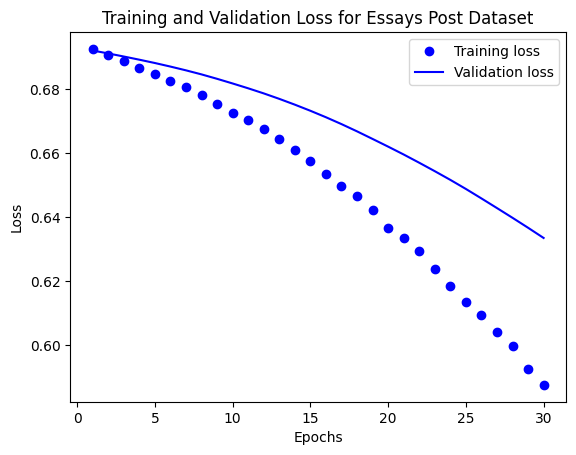

In [ ]:
acc = history_dict['binary_accuracy']
val_acc = history_dict['val_binary_accuracy']
loss = history_dict['loss']
val_loss = history_dict['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation Loss for Essays Post Dataset')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

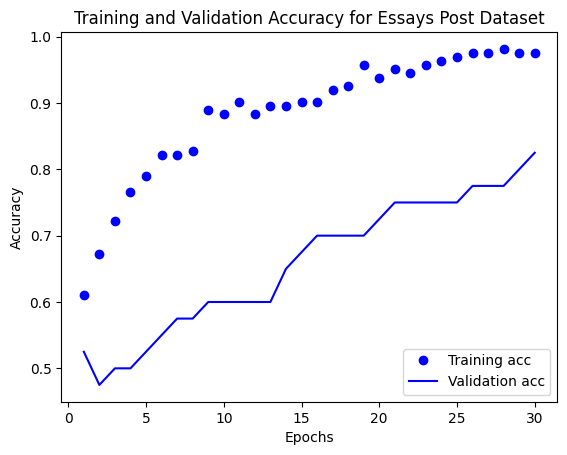

In [ ]:
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and Validation Accuracy for Essays Post Dataset')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.show()

In [ ]:
essay_export_model = tf.keras.Sequential([
  vectorize_layer,
  essay_model,
  layers.Activation('sigmoid')
])

essay_export_model.compile(
    loss=losses.BinaryCrossentropy(from_logits=False), optimizer="adam", metrics=['accuracy']
)

# Test it with `raw_test_ds`, which yields raw strings
loss, accuracy = essay_export_model.evaluate(raw_test_ds)
print(accuracy)

2/2 [==============================] - 1s 16ms/step - loss: 0.6304 - accuracy: 0.7600
0.7599999904632568


In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=5e6daaf223ba71699dae829419cb4a27c87d61fe660021573f54d2d6be240e08
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [ ]:
from lime.lime_text import LimeTextExplainer

In [ ]:
reddit_data['gpt-score'] = np.nan
reddit_data['real-score'] = np.nan

for index,row in reddit_data.iterrows():
  reddit_data.at[index, 'gpt-score'] = reddit_export_model.predict([row['gpt']], verbose = 0)[0][0]
  reddit_data.at[index, 'real-score'] = reddit_export_model.predict([row['real']], verbose = 0)[0][0]

In [ ]:
print ("Average GPT Score: " + str(np.mean(reddit_data['gpt-score'])))
print ("Median GPT Score: " + str(np.median(reddit_data['gpt-score'])))
print ("Number Classified Incorrectly: " + str(len(reddit_data[reddit_data['gpt-score'] > 0.5])))

print ("Most confident classifications:")
reddit_data.sort_values('gpt-score', ascending=True).head(5)[['gpt','gpt-score']]

Average GPT Score: 0.3029449309696231
Median GPT Score: 0.2797083258628845
Number Classified Incorrectly: 57
Most confident classifications:


,gpt,gpt-score
352,"\n\nHey everyone,\n\nI'm sure many of you can relate to this: I've been in a relationship for about two years now, and it's been great. We've been through a lot together, and I'm so grateful for our bond.\n\nHowever, lately I've been feeling like I'm stuck in a rut. We've been having sex the same way for a while, and it's starting to feel a bit boring. I'm not sure how to bring up the topic without making it awkward.\n\nAny advice? Has anyone else been in this situation before?\n\nThanks!",0.076412
549,"\n\nI think it's so important to practice safe sex, especially in this day and age. We all know the risks of unprotected sex, and it's important to take the necessary precautions to prevent any unwanted consequences. But I think it's also important to remember to enjoy sex, and not just use it as a way to get rid of a pimple or something. Sex should be an enjoyable experience, and it's important to be aware of the risks and to take the necessary steps to protect yourself and your partner. So just be careful, use protection, and try to do it to enjoy it, not to get rid of a pimple.",0.081804
116,"\n\nHey everyone! \n\nIt's great to be back on campus and the weather has been perfect so far! Let's all make sure we stay safe and take precautions. \n\nWe have a great community here at NAU and it's important to get to know your classmates and neighbors. There are plenty of clubs and organizations to join, so don't miss out! \n\nAlso, don't forget to check out all the important pages on the NAU website and make sure to check your LOUIE account often for payment updates. \n\nWelcome back, everyone! Let's make it a great semester!",0.082242
355,"\n\nHey everyone! \n\nI'm relatively new to guitar playing and I'm looking for some advice on open tunings, practice, and listening to lots of blues. I've been playing for about a year and have been trying to learn some open tunings, but I'm having some trouble with them. I'm also trying to practice regularly and listen to lots of blues, but I'm not sure what to focus on. \n\nAny advice would be greatly appreciated! Thanks!",0.082896
245,"\n\nHey everyone!\n\nI recently started running and have been trying to find ways to stay motivated. One thing I've been doing is setting small goals for myself, like running a certain distance or running to a certain place. But I've also been trying to focus on the experience of running, rather than just the goals. \n\nTo that end, I've been trying to ""show, don't tell"" when it comes to running. Instead of thinking about how far I want to run or how fast I want to go, I've been trying to focus on how my body feels when I'm running, how the scenery looks, and how I'm feeling mentally. \n\nI find that this approach helps me to stay in the present and enjoy the experience of running more. It's also helped me to stay motivated and keep pus...",0.094584


In [ ]:
print ("Average GPT Score: " + str(np.mean(reddit_data['real-score'])))
print ("Median GPT Score: " + str(np.median(reddit_data['real-score'])))
print ("Number Classified Incorrectly: " + str(len(reddit_data[reddit_data['real-score'] < 0.5])))

print ("Most confident classifications:")
reddit_data.sort_values('real-score', ascending=False).head(5)[['real','real-score']]

Average GPT Score: 0.7488070689272462
Median GPT Score: 0.8277995586395264
Number Classified Incorrectly: 140
Most confident classifications:


,real,real-score
453,"Buy a used 200L instead of the 400L. I have owned both. \n\nThe 200L is two stops wider than the 400 and has half the focal length. Because of this the light required to get a sharp image is about 4 stops lower (2 stops aperture, 2 stops shutter speed). You can use your 200L when the sun starts going down. That's advantage 1. \n\nThe 200L is much lighter and smaller than the 400L. Advantage 2. \n\nThe 200L is, give or take, half the price of the 400L. Advantage 3. \n\nThe 200mm focal length has more uses than the 400L. Advantage 4. \n\nThe kicker? The 400L is tack sharp. Holy Jesus or Unholy Satin, I don't know who did this, but my 200L has 90% of the sharpness at 2:1 magnification that the 400L has at 1:1. It's ridiculous. Remember how...",0.996596
810,First tattoo was the day I turned 18. I got my name with some tribal ish to the sides of it as a tramp stamp... Smh. I spent the last 2 years turning it into a back piece to unattach myself from the tramp stamp label. I must admit I love it now that its taken over my back. \nI have a fleur de les on my ankle as a memorial for my grandmother. She picked the specific style out before passing away. \nThird piece was a friendship tattoo. It's a Celtic knot with anam cara (gaelic for soul friend) written above it on my hip. My best friend has the same words but an infinity symbol instead of knot. \nMy fourth tattoo was a blue orb surrounded by purple lilies on the back of my neck/shoulder blade area. \nI also have two koi fish swimming up my...,0.996108
267,"&gt; I'm 15, and I do believe in God, but I hate him.\n\nWhy do you believe? Perhaps you should examine that position. You mention Christians and the Second Coming - so the God to whom you are referring to is the monotheistic YHWH/Yahweh/Jehovah/Allah/God of Abraham (all names for the same Deity). What supports you belief in that Deity vs. the other 6000+ deities for which you appear to be atheistic?\n\n&gt; To help me see clearly, could you recommend me something to read?\n\nSpecific to the monotheistic Yahweh - A foundational belief in the Abrahamic religions (Judaism, Christianity, Islam) is that Allah, God, or Yahweh/YHWH, is the only true revealed God. As this is also the core of the Tanakh (Judaism), Bible (Christianity), and Q...",0.995072
668,"* Muggle history isn't wrong, it just doesn't include Wizarding history, and changes a few things (like witches escaping execution).\n* Science doesn't cease to exist. Magic is a nice substitute, of course, but just because you can boil water with your wand that doesn't render a teapot useless. If anything, magic speeds up science and creates shortcuts. Potions is like Chemistry on steroids, there's many new reactions to learn!\n* Math still matters when dealing with finances, measurements, etc. Math isn't that useful when you're an adult in the Muggle world either, depending on your occupation.\n* The professors correcting your essays would still take off points for bad grammar, even if Hogwarts doesn't have a class on writing.\n* You ...",0.994159
674,"I don't give a shit about the opinion of people who work at the NFL Network. I work in live sports television at one of the largest and most watched regional sports networks in the country, does that mean my opinion counts more than yours? By your logic it apparently does. \n\nArguing other people's opinions to try and make your own doesn't mean anything to me because opinions are just that, opinions. You know what matters? Facts. So here's some facts for you.\n\nPeyton Manning has started and played 14 full seasons (not including 2011 when he was out all year) and until this past season played a guaranteed 9 games in a dome each year and another guaranteed 2 away games at warm weather stadiums for almost every year of his career. If he...",0.992415


In [ ]:
def predict_proba(arr):
  output = []
  for text in arr:
    text = text.strip()
    if len(text) != 0:
      prob = reddit_export_model.predict([text], verbose = 0)[0][0]
      output.append(np.array([1-prob, prob]))
    else:
      output.append(np.array([0.5,0.5]))
    
  return np.array(output)

In [ ]:
explainer = LimeTextExplainer(class_names = ["GPT", "Real"])
text = "\n\nHave you ever wanted to experience something that you can't explain? Something that is beyond your own consciousness? DMT is a drug unlike any other that can bring you to a place that you have never been before.\n\nI believe that everyone who is considering trying DMT should do so correctly and safely. When taken correctly, it usually lasts from 5-15 minutes, and I typically sprinkle it on a bowl of weed and hold a lighter far enough away to vaporize/slightly combust the bud.\n\nCompared to other psychedelics, DMT is a far different experience. If salvia is a freakish nightmare, DMT is a beautiful and lucid dream. It can bring you to a place of understanding, creativity, and peace.\n\nIf you are considering trying DMT, please do so ..."
LIME_exp = explainer.explain_instance(text, predict_proba, num_samples = 2000, num_features = 10)

In [ ]:
LIME_exp.show_in_notebook(text = True)

In [ ]:
explainer = LimeTextExplainer(class_names = ["GPT", "Real"])
text = "sure! took a photograph of my face, and then another in the same position with my hands covering the face. selected the hands and isolated them from the rest. altered the contrast, saturation, and what have you. imported said hands into the image with the face, and used the photoshop effect \"overlay\" to combine the two images. then tooled around with the levels and everything til it looked how i wanted.\n\n**tl;dr:** photoshop magic."
LIME_exp = explainer.explain_instance(text, predict_proba, num_samples = 2000, num_features = 10)

In [ ]:
LIME_exp.show_in_notebook(text = True)

# Abstract Classifier

Based on https://www.tensorflow.org/tutorials/keras/text_classification

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import matplotlib.pyplot as plt
import os
import re
import shutil
import string
import tensorflow as tf
import numpy as np
import pandas as pd
import random

from tensorflow.keras import layers
from tensorflow.keras import losses

v---------------- needed later ---------------------------v

In [ ]:
abstracts = pd.read_csv('./drive/MyDrive/CMSC742 Project/Datasets/abstracts.csv')

In [ ]:
abstracts = abstracts.dropna()
abstracts.head()

,id,authors,title,category,abstract,versions,update_date,new_category,generated_abstract,prompt
0,2008.12750,"Dimitris Perdios, Manuel Vonlanthen, Florian M...",CNN-Based Image Reconstruction Method for Ultr...,"['eess.IV', 'cs.CV', 'cs.LG']",Ultrafast ultrasound (US) revolutionized bio...,"[{'version': 'v1', 'created': 'Fri, 28 Aug 202...",2022-04-04,"['Computer Vision and Pattern Recognition', 'M...",This paper presents a novel CNN-based image re...,Write an abstract for a paper called CNN-Based...
1,2207.14561,"Yuki Kadokawa, Lingwei Zhu, Yoshihisa Tsurumin...",Cyclic Policy Distillation: Sample-Efficient S...,"['cs.RO', 'cs.LG']",Deep reinforcement learning with domain rand...,"[{'version': 'v1', 'created': 'Fri, 29 Jul 202...",2023-04-11,"['Robotics', 'Machine Learning']",", and Artificial Intelligence\n\nThis paper pr...",Write an abstract for a paper called Cyclic Po...
2,2207.08389,"Amir H. Ashouri, Mostafa Elhoushi, Yuzhe Hua, ...",MLGOPerf: An ML Guided Inliner to Optimize Per...,"['cs.PL', 'cs.AI', 'cs.LG', 'cs.NE', 'cs.PF']","For the past 25 years, we have witnessed an ...","[{'version': 'v1', 'created': 'Mon, 18 Jul 202...",2023-01-18,"['Programming Languages', 'Artificial Intellig...","This paper introduces MLGOPerf, a novel machin...",Write an abstract for a paper called MLGOPerf:...
3,2204.11428,"Prantika Chakraborty, Sudakshina Dutta, Debars...",Personal Research Knowledge Graphs,"['cs.IR', 'cs.HC']",Maintaining research-related information in ...,"[{'version': 'v1', 'created': 'Mon, 25 Apr 202...",2022-04-26,"['Information Retrieval', 'Human-Computer Inte...",", and Machine Learning\n\nThis paper investiga...",Write an abstract for a paper called Personal ...
4,2209.10117,"Wenqi Fan, Xiangyu Zhao, Xiao Chen, Jingran Su...",A Comprehensive Survey on Trustworthy Recommen...,"['cs.IR', 'cs.AI', 'cs.CR', 'cs.LG']",As one of the most successful AI-powered app...,"[{'version': 'v1', 'created': 'Wed, 21 Sep 202...",2022-09-22,"['Information Retrieval', 'Artificial Intellig...",This paper presents a comprehensive survey of ...,Write an abstract for a paper called A Compreh...


In [ ]:
gpt_label = [0] * len(abstracts['generated_abstract'])
real_label = [1] * len(abstracts['abstract'])

^------------ used later -------------------^

In [ ]:
batch_size = 32
seed = 42

raw_train_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/abstracts/train/', 
    batch_size=batch_size, 
    validation_split=0.2, 
    subset='training', 
    seed=seed)

Found 1206 files belonging to 2 classes.
Using 965 files for training.


In [ ]:
for text_batch, label_batch in raw_train_ds.take(1):
  for i in range(3):
    print("Review", text_batch.numpy()[i])
    print("Label", label_batch.numpy()[i])

Review b'This paper presents a novel approach to reduce the domain gap in frequency and spatial domain for cross-modality domain adaptation on medical image segmentation. The proposed approach utilizes a combination of frequency domain and spatial domain feature extraction techniques to reduce the domain gap between different modalities of medical images. The frequency domain features are extracted using a Convolutional Neural Network (CNN) and the spatial domain features are extracted using a Support Vector Machine (SVM). The performance of the proposed approach is evaluated on a publicly available medical image segmentation dataset. The results demonstrate that the proposed approach is able to reduce the domain gap between different modalities of medical images and achieve a higher accuracy in segmentation compared to the baseline methods. The paper also provides an in-depth analysis of the results and discusses the implications of the proposed approach for cross-modality domain adap

In [ ]:
print("Label 0 corresponds to", raw_train_ds.class_names[0])
print("Label 1 corresponds to", raw_train_ds.class_names[1])

Label 0 corresponds to GPT
Label 1 corresponds to Real


In [ ]:
raw_val_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/abstracts/train/', 
    batch_size=batch_size, 
    validation_split=0.2, 
    subset='validation', 
    seed=seed)

Found 1206 files belonging to 2 classes.
Using 241 files for validation.


In [ ]:
raw_test_ds = tf.keras.utils.text_dataset_from_directory(
    '/content/drive/MyDrive/CMSC742 Project/Datasets/abstracts/test/', 
    batch_size=batch_size)

Found 302 files belonging to 2 classes.


In [ ]:
# numbers from tutorial
max_features = 10000
sequence_length = 250

vectorize_layer = layers.TextVectorization(
    max_tokens = max_features,
    output_mode = 'int',
    output_sequence_length = sequence_length
)

In [ ]:
train_text = raw_train_ds.map(lambda x, y: x)
vectorize_layer.adapt(train_text)

In [ ]:
def vectorize_text(text, label):
  text = tf.expand_dims(text, -1)
  return vectorize_layer(text), label

In [ ]:
raw_train_ds.class_names

['GPT', 'Real']

In [ ]:
print("1287 ---> ",vectorize_layer.get_vocabulary()[1287])
print(" 313 ---> ",vectorize_layer.get_vocabulary()[313])
print('Vocabulary size: {}'.format(len(vectorize_layer.get_vocabulary())))

1287 --->  track
 313 --->  size
Vocabulary size: 9773


In [ ]:
train_ds = raw_train_ds.map(vectorize_text)
val_ds = raw_val_ds.map(vectorize_text)
test_ds = raw_test_ds.map(vectorize_text)

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
embedding_dim = 16

In [ ]:
abstract_model = tf.keras.Sequential([
  layers.Embedding(max_features + 1, embedding_dim),
  layers.Dropout(0.2),
  layers.GlobalAveragePooling1D(),
  layers.Dropout(0.2),
  layers.Dense(1)])

abstract_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 16)          160016    
                                                                 
 dropout (Dropout)           (None, None, 16)          0         
                                                                 
 global_average_pooling1d (G  (None, 16)               0         
 lobalAveragePooling1D)                                          
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense (Dense)               (None, 1)                 17        
                                                                 
Total params: 160,033
Trainable params: 160,033
Non-trainable params: 0
__________________________________________________

In [ ]:
abstract_model.compile(loss=losses.BinaryCrossentropy(from_logits=True),
              optimizer='adam',
              metrics=tf.metrics.BinaryAccuracy(threshold=0.0))

In [ ]:
epochs = 30
history = abstract_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs)

Epoch 1/30
31/31 [==============================] - 4s 74ms/step - loss: 0.6890 - binary_accuracy: 0.5658 - val_loss: 0.6858 - val_binary_accuracy: 0.5602
Epoch 2/30
31/31 [==============================] - 0s 8ms/step - loss: 0.6768 - binary_accuracy: 0.6135 - val_loss: 0.6762 - val_binary_accuracy: 0.6141
Epoch 3/30
31/31 [==============================] - 0s 8ms/step - loss: 0.6630 - binary_accuracy: 0.6528 - val_loss: 0.6644 - val_binary_accuracy: 0.6390
Epoch 4/30
31/31 [==============================] - 0s 8ms/step - loss: 0.6462 - binary_accuracy: 0.6850 - val_loss: 0.6506 - val_binary_accuracy: 0.6680
Epoch 5/30
31/31 [==============================] - 0s 8ms/step - loss: 0.6261 - binary_accuracy: 0.7150 - val_loss: 0.6350 - val_binary_accuracy: 0.6929
Epoch 6/30
31/31 [==============================] - 0s 7ms/step - loss: 0.6074 - binary_accuracy: 0.7399 - val_loss: 0.6181 - val_binary_accuracy: 0.7344
Epoch 7/30
31/31 [==============================] - 0s 8ms/step - loss: 0.5

In [ ]:
loss, accuracy = abstract_model.evaluate(test_ds)

print("Loss: ", loss)
print("Accuracy: ", accuracy)

10/10 [==============================] - 1s 6ms/step - loss: 0.2403 - binary_accuracy: 0.9371
Loss:  0.24034924805164337
Accuracy:  0.9370861053466797


In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

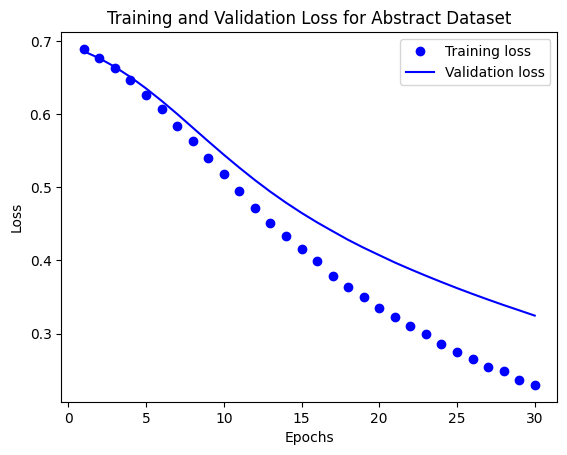

In [ ]:
acc = history_dict['binary_accuracy']
val_acc = history_dict['val_binary_accuracy']
loss = history_dict['loss']
val_loss = history_dict['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation Loss for Abstract Dataset')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

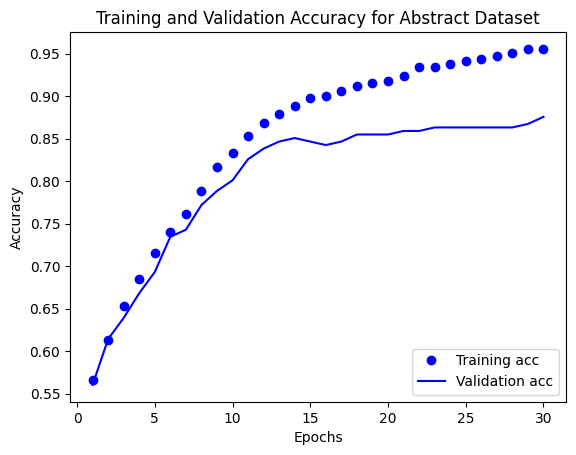

In [ ]:
plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and Validation Accuracy for Abstract Dataset')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.show()

In [ ]:
abstract_export_model = tf.keras.Sequential([
  vectorize_layer,
  abstract_model,
  layers.Activation('sigmoid')
])

abstract_export_model.compile(
    loss=losses.BinaryCrossentropy(from_logits=False), optimizer="adam", metrics=['accuracy']
)

# Test it with `raw_test_ds`, which yields raw strings
loss, accuracy = abstract_export_model.evaluate(raw_test_ds)
print(accuracy)

10/10 [==============================] - 2s 14ms/step - loss: 0.2403 - accuracy: 0.9371
0.9370861053466797


In [ ]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=e3d84b19f7675bba42a5baab7b87e748de75d4481ac5d8b9ad9435cb105e6e70
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [ ]:
from lime.lime_text import LimeTextExplainer

In [ ]:
[for f in ]

In [ ]:
pd.set_option('max_colwidth', 750)

In [ ]:
print ("Average GPT Score: " + str(np.mean(abstracts['gpt-score'])))
print ("Median GPT Score: " + str(np.median(abstracts['gpt-score'])))
print ("Number Classified Incorrectly: " + str(len(abstracts[abstracts['gpt-score'] > 0.5])))

print ("Most confident classifications:")
abstracts.sort_values('gpt-score', ascending=True).head(5)[['generated_abstract','gpt-score']]

Average GPT Score: 0.17872343884795824
Median GPT Score: 0.16198879480361938
Number Classified Incorrectly: 9
Most confident classifications:


,generated_abstract,gpt-score
383,"and Systems\n\nThis paper presents a survey of machine learning techniques used in computer architecture and systems. The paper reviews various machine learning models, such as deep learning, reinforcement learning, and evolutionary algorithms, and discusses their use in hardware architecture and systems. The paper also discusses the challenges and opportunities associated with using machine learning in computer architecture and systems. Finally, the paper provides an overview of the current state of machine learning in computer architecture and systems, and highlights potential future research directions.",0.040536
57,"This paper surveys the current state of data distillation techniques in machine learning, computer vision and pattern recognition, and information retrieval. It provides a comprehensive overview of the various techniques, their advantages and disadvantages, and their potential applications. It also examines the challenges and opportunities that data distillation presents for the future of these fields. The paper concludes with a discussion of the potential implications of data distillation for the development of intelligent systems.",0.045477
139,", and Natural Language Processing\n\nThis paper surveys the potential of multimodal learning using transformers for computer vision and pattern recognition, machine learning, and natural language processing. It provides an overview of the recent advances in the field and highlights the various challenges and opportunities associated with multimodal learning. It also discusses the potential of transformers for realizing effective multimodal learning approaches. Finally, the paper provides an outlook on the future of multimodal learning with transformers and its potential applications.",0.047865
251,"This paper presents a novel algorithm selection approach for machine learning tasks that involve spatial branching. The approach uses a combination of supervised and unsupervised learning techniques to select the best algorithm for a given task. It is evaluated on two real-world datasets and the results demonstrate that the proposed approach outperforms existing algorithm selection techniques. Furthermore, the paper introduces a new metric to measure the effectiveness of the algorithm selection approach. The paper also discusses the potential implications of the proposed approach for future work in the area of machine learning.",0.047867
454,"This paper presents a novel hybrid prompt-tuning approach to knowledge-augmented frame semantic parsing. It combines the advantages of prompt-tuning and knowledge-augmented frame semantic parsing to enable more efficient and accurate parsing. The proposed approach is evaluated on a standard benchmark dataset and compared to existing methods. The results demonstrate that the proposed approach significantly outperforms existing methods in both accuracy and speed. Furthermore, the paper discusses the implications of the proposed approach for both natural language processing and computation.",0.048707


In [ ]:
print ("Average GPT Score: " + str(np.mean(abstracts['real-score'])))
print ("Median GPT Score: " + str(np.median(abstracts['real-score'])))
print ("Number Classified Incorrectly: " + str(len(abstracts[abstracts['real-score'] < 0.5])))

print ("Most confident classifications:")
abstracts.sort_values('real-score', ascending=False).head(5)[['abstract','real-score']]

Average GPT Score: 0.8021298863675534
Median GPT Score: 0.876948207616806
Number Classified Incorrectly: 78
Most confident classifications:


,abstract,real-score
648,"We consider a matching problem in a bipartite graph $G=(A\cup B,E)$ where\neach node in $A$ is an agent having preferences in partial order over her\nneighbors, while nodes in $B$ are objects with no preferences. The size of our\nmatching is more important than node preferences; thus, we are interested in\nmaximum matchings only. Any pair of maximum matchings in $G$ (equivalently,\nperfect matchings or assignments) can be compared by holding a head-to-head\nelection between them where agents are voters. The goal is to compute an\nassignment $M$ such that there is no better or ""more popular"" assignment. This\nis the popular assignment problem and it generalizes the well-studied popular\nmatching problem.\n Popular assignments need not...",0.998908
255,"Message passing neural networks (MPNNs) have become a dominant flavor of\ngraph neural networks (GNNs) in recent years. Yet, MPNNs come with notable\nlimitations; namely, they are at most as powerful as the 1-dimensional\nWeisfeiler-Leman (1-WL) test in distinguishing graphs in a graph isomorphism\ntesting frame-work. To this end, researchers have drawn inspiration from the\nk-WL hierarchy to develop more expressive GNNs. However, current\nk-WL-equivalent GNNs are not practical for even small values of k, as k-WL\nbecomes combinatorially more complex as k grows. At the same time, several\nworks have found great empirical success in graph learning tasks without highly\nexpressive models, implying that chasing expressiveness with a coar...",0.997179
44,"Network function virtualization (NFV) is an emerging design paradigm that\nreplaces physical middlebox devices with software modules running on general\npurpose commodity servers. While gradually transitioning to NFV, Internet\nservice providers face the problem of where to introduce NFV in order to make\nthe most benefit of that; here, we measure the benefit by the amount of traffic\nthat can be served in an NFV-enabled network. This problem is non-trivial as it\nis composed of two challenging subproblems: 1) placement of nodes to support\nvirtual network functions (referred to as VNF-nodes); 2) allocation of the\nVNF-nodes' resources to network flows. This problem has been studied for the\none-dimensional setting, where all network ...",0.996679
150,"We consider the Connectivity Augmentation Problem (CAP), a classical problem\nin the area of Survivable Network Design. It is about increasing the\nedge-connectivity of a graph by one unit in the cheapest possible way. More\nprecisely, given a $k$-edge-connected graph $G=(V,E)$ and a set of extra edges,\nthe task is to find a minimum cardinality subset of extra edges whose addition\nto $G$ makes the graph $(k+1)$-edge-connected. If $k$ is odd, the problem is\nknown to reduce to the Tree Augmentation Problem (TAP) -- i.e., $G$ is a\nspanning tree -- for which significant progress has been achieved recently,\nleading to approximation factors below $1.5$ (the currently best factor is\n$1.458$). However, advances on TAP did not carry over...",0.996599
438,"In this paper, we investigate the question: Given a small number of\ndatapoints, for example N = 30, how tight can PAC-Bayes and test set bounds be\nmade? For such small datasets, test set bounds adversely affect generalisation\nperformance by withholding data from the training procedure. In this setting,\nPAC-Bayes bounds are especially attractive, due to their ability to use all the\ndata to simultaneously learn a posterior and bound its generalisation risk. We\nfocus on the case of i.i.d. data with a bounded loss and consider the generic\nPAC-Bayes theorem of Germain et al. While their theorem is known to recover\nmany existing PAC-Bayes bounds, it is unclear what the tightest bound derivable\nfrom their framework is. For a fixed l...",0.996491


In [ ]:
abstracts["abstract"][648]

'  We consider a matching problem in a bipartite graph $G=(A\\cup B,E)$ where\neach node in $A$ is an agent having preferences in partial order over her\nneighbors, while nodes in $B$ are objects with no preferences. The size of our\nmatching is more important than node preferences; thus, we are interested in\nmaximum matchings only. Any pair of maximum matchings in $G$ (equivalently,\nperfect matchings or assignments) can be compared by holding a head-to-head\nelection between them where agents are voters. The goal is to compute an\nassignment $M$ such that there is no better or "more popular" assignment. This\nis the popular assignment problem and it generalizes the well-studied popular\nmatching problem.\n  Popular assignments need not always exist. We show a polynomial-time\nalgorithm that decides if the given instance admits one or not, and computes\none, if so. In instances with no popular assignment, we consider the problem of\nfinding an almost popular assignment, i.e., an assi

In [ ]:
def predict_proba(arr):
  output = []
  for text in arr:
    text = text.strip()
    if len(text) != 0:
      prob = abstract_export_model.predict([text], verbose = 0)[0][0]
      output.append(np.array([1-prob, prob]))
    else:
      output.append(np.array([0.5,0.5]))
    
  return np.array(output)

In [ ]:
explainer = LimeTextExplainer(class_names = ["GPT", "Real"])
text = "This paper presents a survey of machine learning techniques used in computer architecture and systems. The paper reviews various machine learning models, such as deep learning, reinforcement learning, and evolutionary algorithms, and discusses their use in hardware architecture and systems. The paper also discusses the challenges and opportunities associated with using machine learning in computer architecture and systems. Finally, the paper provides an overview of the current state of machine learning in computer architecture and systems, and highlights potential future research directions. 	"
LIME_exp = explainer.explain_instance(text, predict_proba, num_samples = 2000, num_features = 10)

In [ ]:
LIME_exp.show_in_notebook(text = True)

In [ ]:
explainer = LimeTextExplainer(class_names = ["GPT", "Real"])
text = abstracts["abstract"][648]
LIME_exp = explainer.explain_instance(text, predict_proba, num_samples = 2000, num_features = 25)

In [ ]:
LIME_exp.show_in_notebook(text = True)